# Détection de Points de Fuite sur des Images de Routes

## Introduction
Dans ce notebook, nous explorons l'utilisation de l'algorithme RANSAC (Random Sample Consensus) pour détecter les points de fuite dans des images de routes. Les points de fuite sont des concepts importants en vision par ordinateur pour comprendre la perspective dans les images. L'objectif est d'identifier les lignes qui convergent vers des points de fuite, dans plusieurs aplications Computer Vision comme la reconstruction 3D ou pilotage automatique.

## Contexte d'Application
L'algorithme RANSAC est utilisé ici pour détecter les points de fuite sur des images de routes. Les points de fuite sont des points vers lesquels les lignes parallèles dans le monde réel convergent dans l'image en raison de la perspective. En identifiant ces points, nous pouvons par exemple estimer la direction des lignes dans l'espace 3D, ce qui est utile pour la reconstruction de la scène et la compréhension de la géométrie de la route à partir d'une seule image.

## Algorithme RANSAC (Random Sample Consensus)
L'algorithme RANSAC est une méthode robuste pour estimer les paramètres d'un modèle mathématique à partir d'un ensemble de données contenant des valeurs aberrantes ou bruitées. Voici comment il est utilisé dans le cadre de la détection de points de fuite :

1. **Initialisation**
   - Sélection aléatoire de paires de lignes parmi un ensemble de lignes détectées.

2. **Estimation d'un Modèle**
   - Calcul des paramètres d'un modèle (hypothèse) à partir des paires sélectionnées (par exemple, l'intersection de ces lignes pour estimer un point de fuite).

3. **Validation du Modèle**
   - Calcul d'une métrique pour chaque ligne par rapport au modèle estimé.
   - Identification des inliers (lignes qui correspondent bien au modèle) en fonction d'un seuil (angle).

4. **Répétition**
   - Répétition des étapes ci-dessus pour un nombre fixe d'itérations.
   - Sélection du modèle avec le plus grand nombre d'inliers comme meilleure estimation.

L'algorithme RANSAC est utilisé de manière itérative pour sélectionner les meilleures hypothèses (modèles) de lignes convergentes vers des points de fuite à partir d'images de routes. Ces points de fuite sont ensuite utilisés pour estimer la direction et la perspective des routes.


## Paramètres Utilisés
Les paramètres utilisés dans notre approche de détection de points de fuite sont les suivants :

- `canny_sigma` : Le paramètre sigma pour l'opérateur Canny utilisé pour détecter les contours dans l'image.
- `hough_line_len` : La longueur minimale des lignes détectées par l'accumulateur de transformée de Hough.
- `hough_line_gap` : L'intervalle maximal autorisé entre les pixels pour lier les lignes dans l'accumulateur de transformée de Hough.
- `ransac_iter` : Le nombre d'itérations à exécuter dans l'algorithme RANSAC pour estimer les modèles de points de fuite.
- `ransac_threshold` : Le seuil d'angle (en degrés) utilisé pour déterminer quels points constituent des inliers par rapport à un modèle de ligne.

Ces paramètres influencent la robustesse et la précision de la détection des points de fuite dans les images de routes. On verra par la suite qu'on les ajuste en fonction des caractéristiques spécifiques des images et des exigences de précision de l'application.




Step 1: Import Necessary Libraries

In [ ]:
import os
import sys
import argparse
import numpy as np
from matplotlib import cm
import matplotlib.pyplot as plt
from skimage import io, feature, color, transform
import ipdb
%matplotlib inline

Basic functions for detecting vanishing lines

In [31]:
def read_image(path):
    image = io.imread(path)
    return image

def get_canny_edges(image, sigma):
    edges = feature.canny(color.rgb2gray(image), sigma=sigma)
    return edges

def get_hough_lines(edges, line_length=50, line_gap=10):
    lines = transform.probabilistic_hough_line(edges, line_length=line_length, line_gap=line_gap)
    return np.asarray(lines)


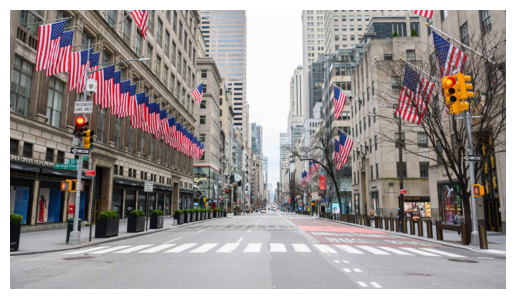

In [188]:
image =read_image("C://Users\wwway/Downloads/new_york.jpg")
# Display the image using matplotlib
plt.imshow(image)
plt.axis('off')  # Turn off axes
plt.show()

Voici la première image sur laquelle on va travailler et essayer d'appliquer notre algo, elle contient des lignes tracée dans la route mais aussi beacoup d'autres lignes donc il faut bien prendre cela en considération our prédire le bon point de fuite

In [7]:
sigma=5
get_canny_edges(image,sigma)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [ ]:
def get_vp_inliers(image_path, sigma, iterations, line_len, line_gap, threshold):
    image = read_image(image_path)
    edges = get_canny_edges(image, sigma=sigma)
    lines = get_hough_lines(edges, line_length=line_len, line_gap=line_gap)

    best_hypothesis_1, best_inliers_1 = run_line_ransac(lines, iterations, threshold)
    ignore_pts = best_inliers_1
    best_hypothesis_2, best_inliers_2 = run_line_ransac(lines, iterations, threshold, ignore_pts=ignore_pts)
    ignore_pts = np.logical_or(best_inliers_1, best_inliers_2)
    best_hypothesis_3, best_inliers_3 = run_line_ransac(lines, iterations, threshold, ignore_pts=ignore_pts)
    inlier_lines_list = [best_inliers_1, best_inliers_2, best_inliers_3]
    best_hypothesis_1 = best_hypothesis_1 / best_hypothesis_1[-1]
    best_hypothesis_2 = best_hypothesis_2 / best_hypothesis_2[-1]
    best_hypothesis_3 = best_hypothesis_3 / best_hypothesis_3[-1]
    hypothesis_list = [best_hypothesis_1, best_hypothesis_2, best_hypothesis_3]
    viz_stuff = [image, edges, lines]
    return inlier_lines_list, hypothesis_list, viz_stuff
def run_line_ransac(lines, ransac_iter, ransac_angle_thresh, ignore_pts=None):
    best_vote_count = 0
    best_inliers = None
    best_hypothesis = None
    if ignore_pts is None:
        ignore_pts = np.zeros((lines.shape[0])).astype('bool')
        lines_to_chose = np.arange(lines.shape[0])
    else:
        lines_to_chose = np.where(ignore_pts==0)[0]
    for iter_count in range(ransac_iter):
        idx1, idx2 = np.random.choice(lines_to_chose, 2, replace=False)
        l1 = np.cross(np.append(lines[idx1][1], 1), np.append(lines[idx1][0], 1))
        l2 = np.cross(np.append(lines[idx2][1], 1), np.append(lines[idx2][0], 1))

        current_hypothesis = np.cross(l1, l2)
        if current_hypothesis[-1] == 0:
            continue
        inliers, vote_count = calculate_metric_angle(current_hypothesis, lines, ignore_pts, ransac_angle_thresh)
        if vote_count > best_vote_count:
            best_vote_count = vote_count
            best_hypothesis = current_hypothesis
            best_inliers = inliers
    return best_hypothesis, best_inliers
def calculate_metric_angle(current_hypothesis, lines, ignore_pts, ransac_angle_thresh):
    current_hypothesis = current_hypothesis / current_hypothesis[-1]
    hypothesis_vp_direction = current_hypothesis[:2] - lines[:, 0]
    lines_vp_direction = lines[:, 1] - lines[:, 0]
    
    magnitude = np.linalg.norm(hypothesis_vp_direction, axis=1) * np.linalg.norm(lines_vp_direction, axis=1)
    magnitude[magnitude == 0] = 1e-5  # Avoid division by zero
    
    cos_theta = (hypothesis_vp_direction * lines_vp_direction).sum(axis=-1) / magnitude
    
    # Handle invalid values
    cos_theta = np.clip(cos_theta, -1.0, 1.0)  # Clip values to valid range for arccos
    
    theta = np.arccos(np.abs(cos_theta))
    
    # Set invalid angles to a large value (or handle differently based on requirements)
    theta[np.isnan(theta)] = np.pi  # Example: Set NaN values to pi
    
    inliers = (theta < ransac_angle_thresh * np.pi / 180)
    inliers[ignore_pts] = False
    
    return inliers, inliers.sum()


c:\Users\wwway\Downloads\Vanishing-Point-Detection-and-3D-Plane-Segmentation-master\Vanishing-Point-Detection-and-3D-Plane-Segmentation-master\python_code\vanishing_point_detection.py:96: RuntimeWarning:

invalid value encountered in arccos



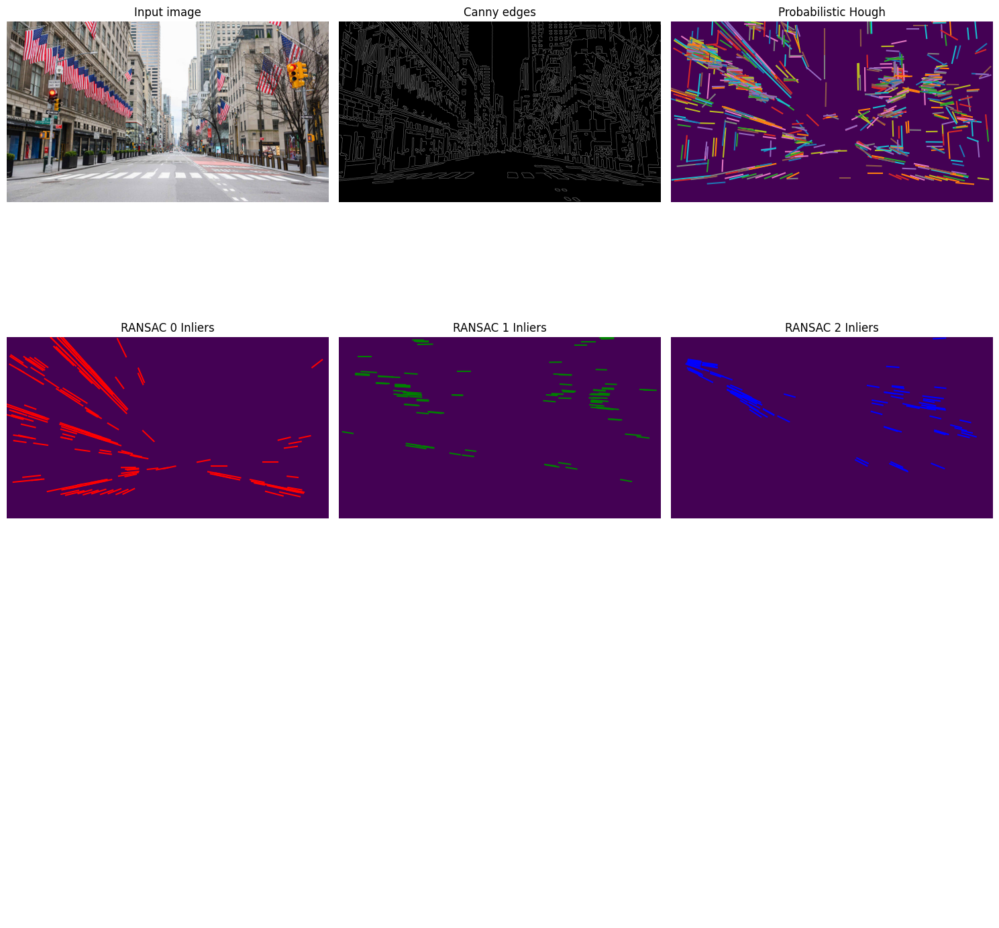

In [189]:
def visualize_inliers(image, edges, lines, inlier_lines_list, colors, fig_name='detected_lines.png'):
    subplot_count = len(inlier_lines_list) + 3

    fig, axes = plt.subplots(3, subplot_count-3, figsize=(15, 15), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image, cmap=cm.gray)
    ax[0].set_title('Input image')

    ax[1].imshow(edges, cmap=cm.gray)
    ax[1].set_title('Canny edges')

    ax[2].imshow(edges * 0)
    for line in lines:
        p0, p1 = line
        ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
    ax[2].set_xlim((0, image.shape[1]))
    ax[2].set_ylim((image.shape[0], 0))
    ax[2].set_title('Probabilistic Hough')
    for i in range(len(inlier_lines_list)):
        ax[i+3].imshow(edges * 0)
        for line in lines[inlier_lines_list[i]]:
            p0, p1 = line
            ax[i+3].plot((p0[0], p1[0]), (p0[1], p1[1]), colors[i])
        ax[i+3].set_xlim((0, image.shape[1]))
        ax[i+3].set_ylim((image.shape[0], 0))
        ax[i+3].set_title('RANSAC {} Inliers'.format(str(i)))

    for a in ax:
        a.set_axis_off()

    plt.tight_layout()
    plt.savefig(fig_name)
    plt.show()
image_path= "C://Users\wwway/Downloads/new_york.jpg"
image =read_image("C://Users\wwway/Downloads/new_york.jpg")
edges=get_canny_edges(image,sigma)
colors = ['r', 'g', 'b']
inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=4000, line_len=60, line_gap=10, threshold=2)
lines = viz_stuff[2]
visualize_inliers(image, edges, lines, inlier_lines_list, colors)


On constate que les lignes convergent plus ou moins dans le premier inliner détecté mais on va ajuster nos paramètres pour améliorer cette détection

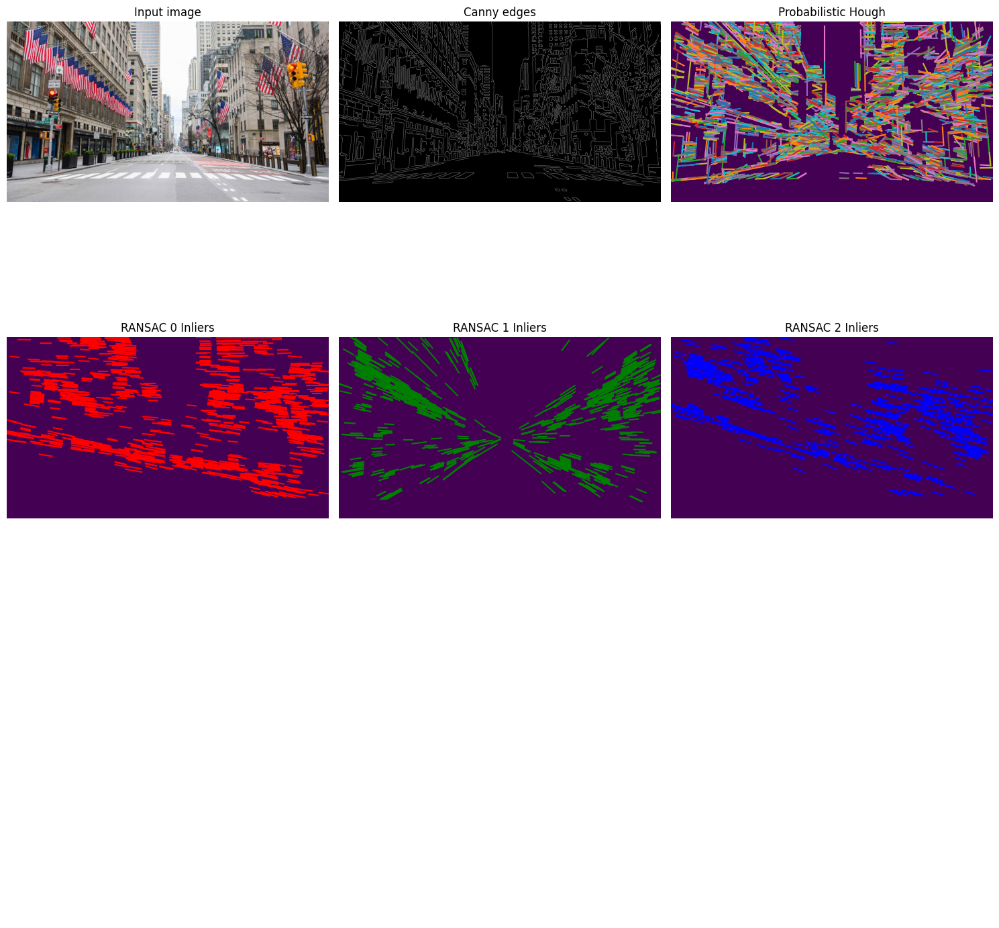

In [46]:
image_path= "C://Users\wwway/Downloads/new_york.jpg"
image =read_image("C://Users\wwway/Downloads/new_york.jpg")
edges=get_canny_edges(image,sigma)
colors = ['r', 'g', 'b']
inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=3000, line_len=50, line_gap=20, threshold=4)
lines = viz_stuff[2]
visualize_inliers(image, edges, lines, inlier_lines_list, colors)

Le second plan convergent, en effet, vers un point de fuite dans la route mais les autres convergent vers un point à l'éecterieur de la photo donc il faut jouer encore sur les paramètres pour ne tenir compte que du point de fuite principal

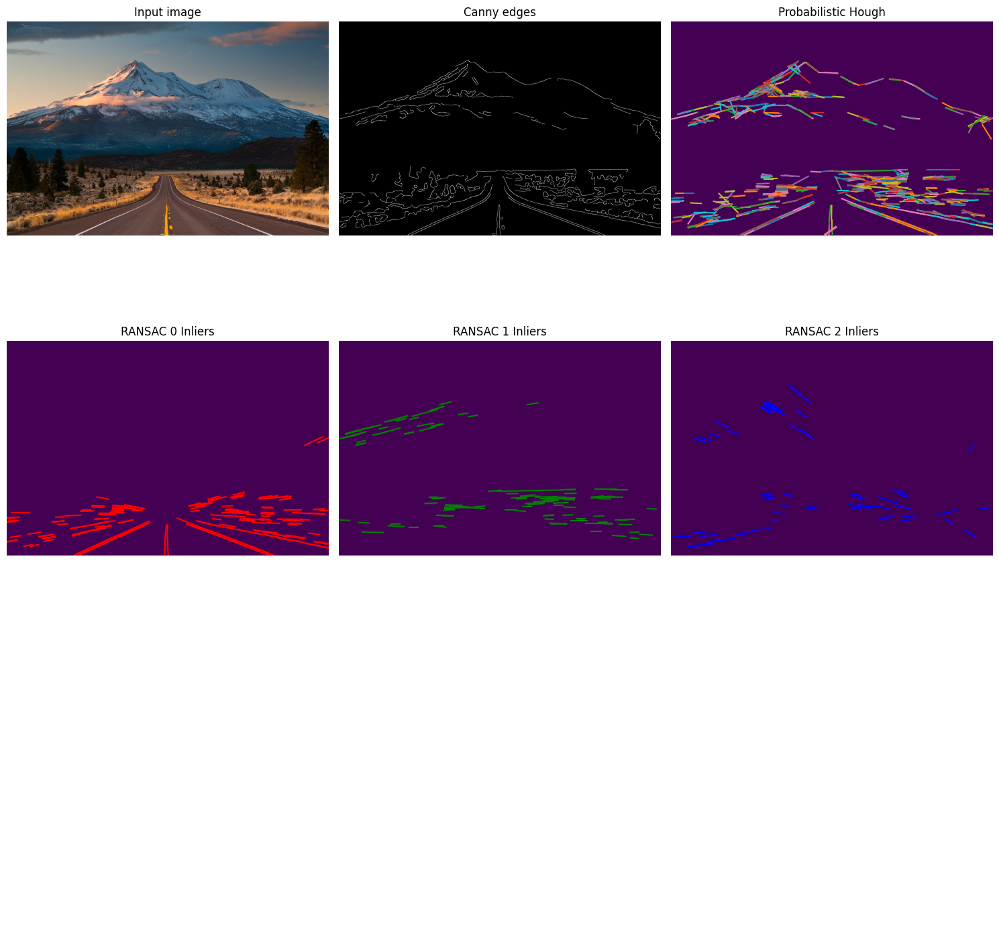

In [75]:
image_path= "c://Users/wwway/Downloads/mountain_road.jpg"
image =read_image("C://Users\wwway/Downloads/mountain_road.jpg")
edges=get_canny_edges(image,sigma)
colors = ['r', 'g', 'b']
inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=3000, line_len=30, line_gap=20, threshold=4)
lines = viz_stuff[2]
visualize_inliers(image, edges, lines, inlier_lines_list, colors)

On arrive alore avec l'algorithme Ransac à identifier 3 points de fuites, le premier est le point de fuite principal, le deuxième est à l'exterieur de l'image (à gauche) et le 3ème est à gauche

On va maintenant représenter les points de fuite dans l'image, on modifie alors la fonction visualize_inliers :

In [133]:

def visualize_inliers(image, edges, lines, inlier_lines_list, colors, hypothesis_list, vp_color='red', fig_name='detected_lines.png'):
    subplot_count = len(inlier_lines_list) + 3

    fig, axes = plt.subplots(3, subplot_count-3, figsize=(15, 15), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(image, cmap=cm.gray)
    ax[0].set_title('Input image')

    ax[1].imshow(edges, cmap=cm.gray)
    ax[1].set_title('Canny edges')

    ax[2].imshow(edges * 0)
    for line in lines:
        p0, p1 = line
        ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
    ax[2].set_xlim((0, image.shape[1]))
    ax[2].set_ylim((image.shape[0], 0))
    ax[2].set_title('Probabilistic Hough')

    for i in range(len(inlier_lines_list)):
        ax[i+3].imshow(edges * 0)
        for line in lines[inlier_lines_list[i]]:
            p0, p1 = line
            ax[i+3].plot((p0[0], p1[0]), (p0[1], p1[1]), colors[i])

        # Plot primary vanishing point (hypothesis) on each subplot with custom color
        ax[i+3].plot(hypothesis_list[i][0], hypothesis_list[i][1], marker='o', color=vp_color, markersize=8)

        ax[i+3].set_xlim((0, image.shape[1]))
        ax[i+3].set_ylim((image.shape[0], 0))
        ax[i+3].set_title('RANSAC {} Inliers'.format(str(i)))

    for a in ax:
        a.set_axis_off()

    plt.tight_layout()
    plt.savefig(fig_name)
    plt.show()
# Draw vanishing point on the original image
    for i in range(len(hypothesis_list)):
        vp_x, vp_y, vp_z = hypothesis_list[i]
        vp_x /= vp_z
        vp_y /= vp_z
        vp_x = int(round(vp_x))
        vp_y = int(round(vp_y))
        cv2.circle(image, (vp_x, vp_y), 15, (255, 0, 0), -1)  # Draw circle at vanishing point

    # Display the modified original image with vanishing points
    plt.imshow(image)
    plt.title('Original Image with Vanishing Points')
    plt.axis('off')
    plt.show()


Pour l'image New York :

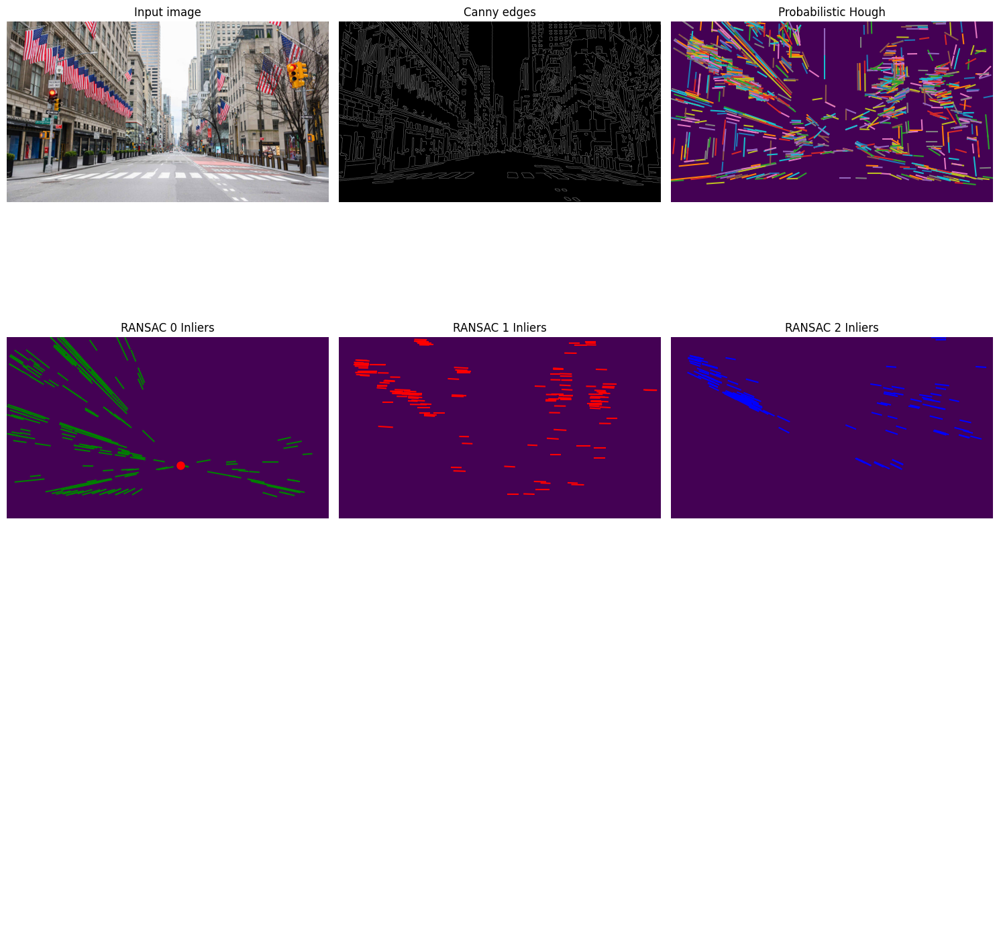

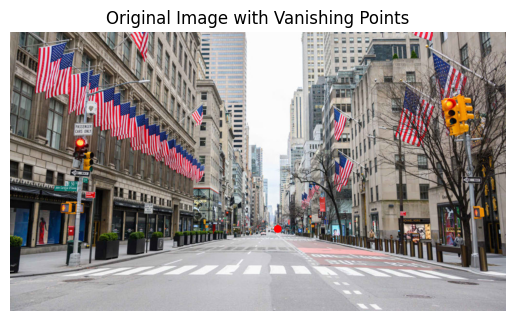

In [134]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import cv2
# Assuming you have defined and called your functions appropriately
image_path = "C://Users/wwway/Downloads/new_york.jpg"
image = read_image(image_path)
edges = get_canny_edges(image, sigma)
colors = ['g', 'r', 'b']
inlier_lines_list, hypothesis_list, viz_stuff = get_vp_inliers(image_path, sigma, iterations=4000, line_len=50, line_gap=10, threshold=2)
lines = viz_stuff[2]

visualize_inliers(image, edges, lines, inlier_lines_list, colors, hypothesis_list)


On arrive donc avec une très bonne précision à détecter notre point de fuite dans cette image malgré l'existence de plusiers lignes

Pour l'image Mountain Road :

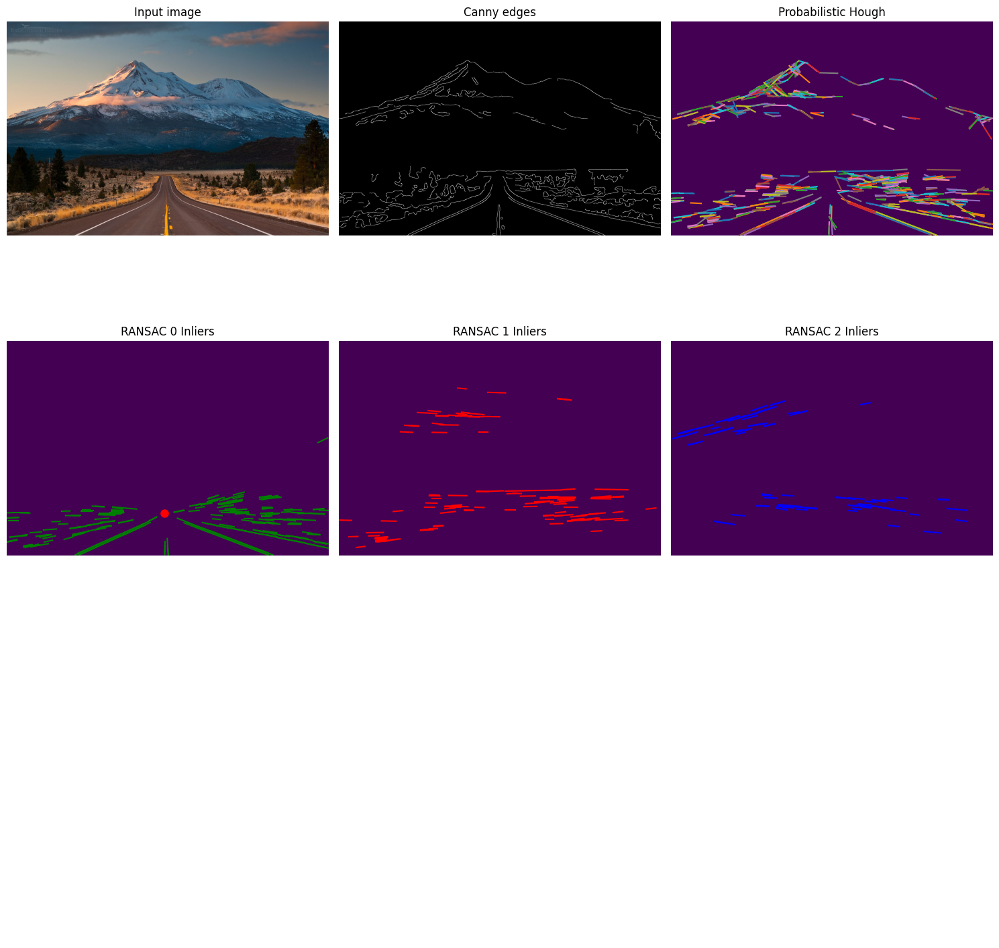

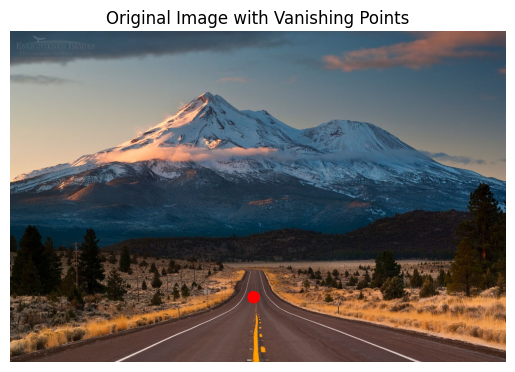

In [139]:

# Assuming you have defined and called your functions appropriately
image_path = "C://Users/wwway/Downloads/mountain_road.jpg"
image = read_image(image_path)
edges = get_canny_edges(image, sigma)
inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=3000, line_len=30, line_gap=20, threshold=4)
lines = viz_stuff[2]

visualize_inliers(image, edges, lines, inlier_lines_list, colors, hypothesis_list)

On arrive à prédire le point de fuite malgré l'existence de plusieurs lignes de fuite (bruit) sur les montagnes

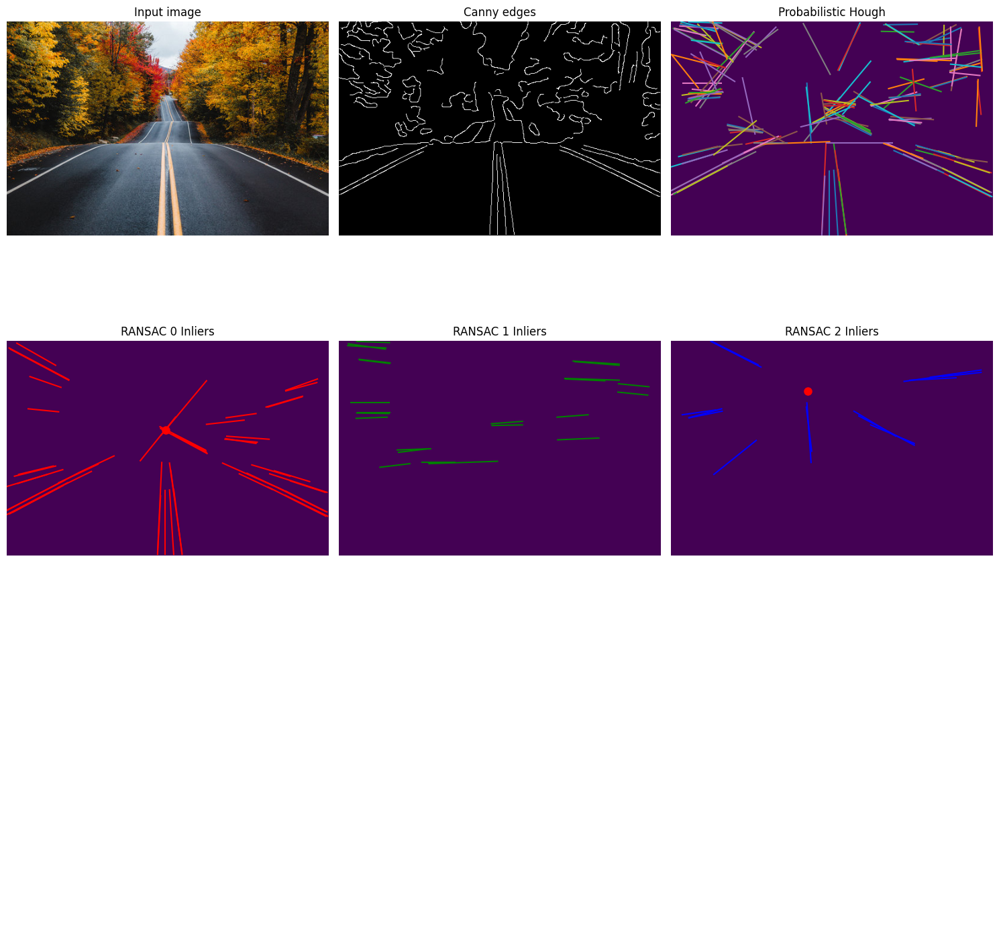

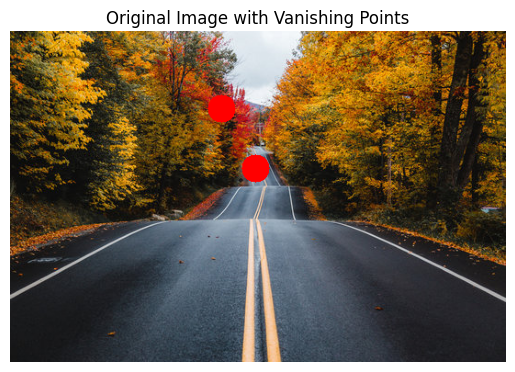

In [168]:

# Assuming you have defined and called your functions appropriately
image_path = "C://Users/wwway/Downloads/curved_road.jpg"
image = read_image(image_path)
edges = get_canny_edges(image, sigma)
inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=3000, line_len=50, line_gap=20, threshold=4)
lines = viz_stuff[2]

visualize_inliers(image, edges, lines, inlier_lines_list, colors, hypothesis_list)

On remarque qu'on arrive à  estimer le point de fuite en augmentant Line_len avec une bonne précision àà l'aide d2 points de fuite qui appartiennent à la direction de la route. C'est une très bonne esstimation des points de fuite vu la nature courbée de la route. On va essayer d'ajuster les paramètres de notre modèle pour améliorer notre résultat

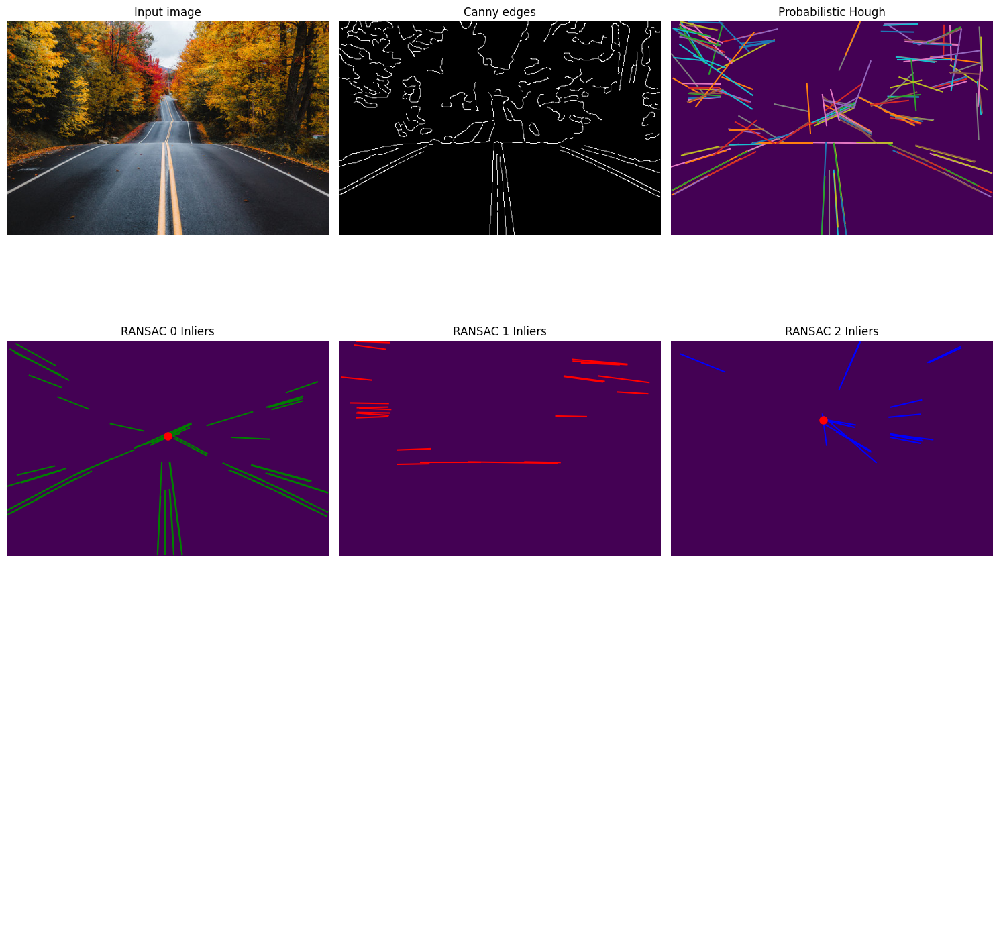

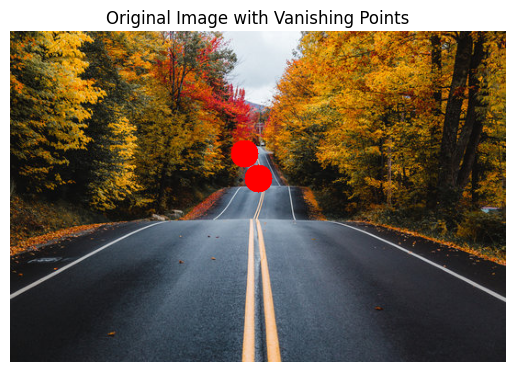

In [141]:

# Assuming you have defined and called your functions appropriately
image_path = "C://Users/wwway/Downloads/curved_road.jpg"
image = read_image(image_path)
edges = get_canny_edges(image, sigma)
inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=3000, line_len=50, line_gap=20, threshold=4)
lines = viz_stuff[2]

visualize_inliers(image, edges, lines, inlier_lines_list, colors, hypothesis_list)

On remarque que les 2 points de fuites s'approchent l'un de l'autre et convergent vers le point de fuite réel

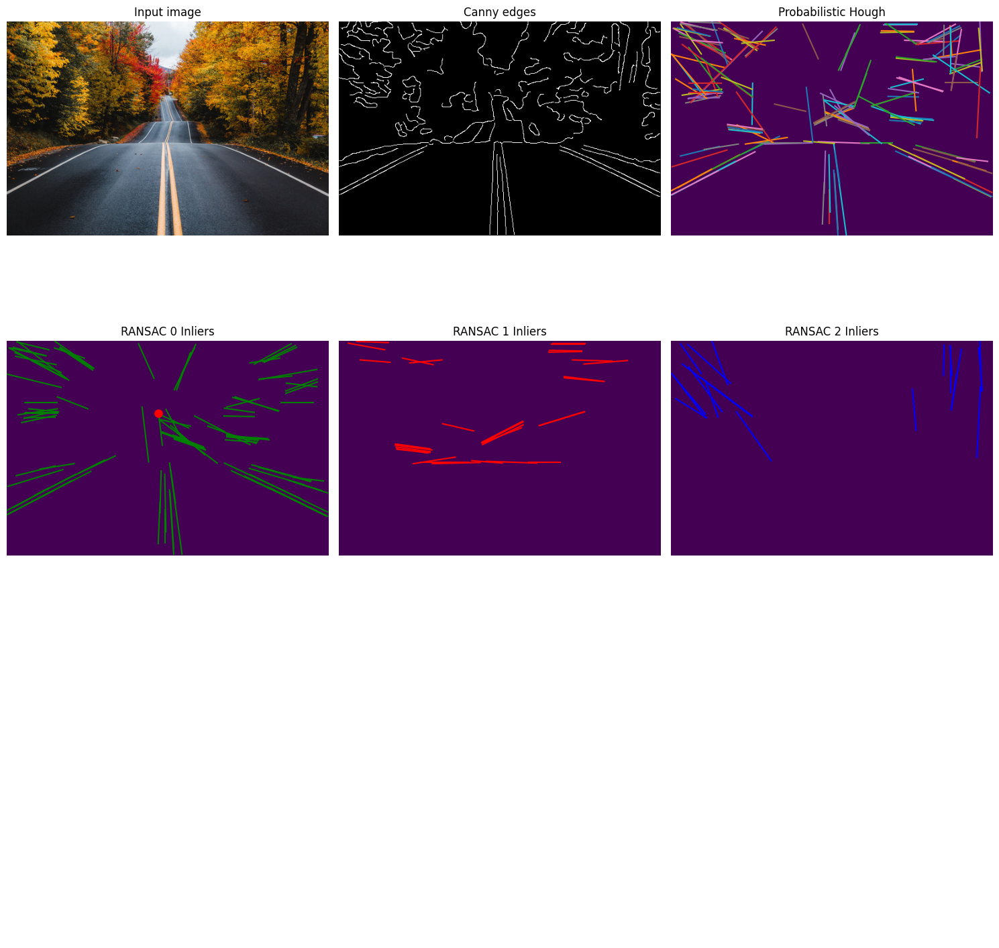

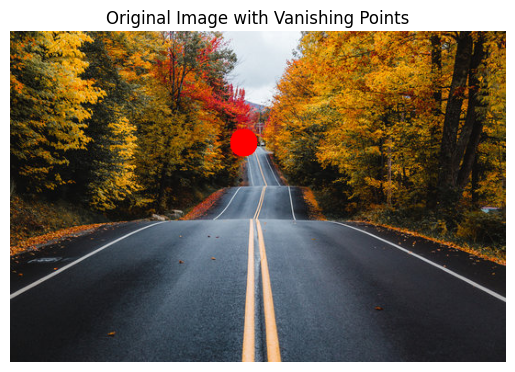

In [155]:

# Assuming you have defined and called your functions appropriately
image_path = "C://Users/wwway/Downloads/curved_road.jpg"
image = read_image(image_path)
edges = get_canny_edges(image, sigma)
inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=3000, line_len=50, line_gap=20, threshold=20)
lines = viz_stuff[2]

visualize_inliers(image, edges, lines, inlier_lines_list, colors, hypothesis_list)

En ajustant aussi Threshold qui permet de filtrer que les lignes de fuites qui convergent un même point on obtient la meilleure estimation du point de fuite.

Les 2 points de fuites sont parfaitement superposés et il s'agit du point de fuite réel. On a donc réussi à prédire correctement le point de fuite malgré la nature courbée de la route

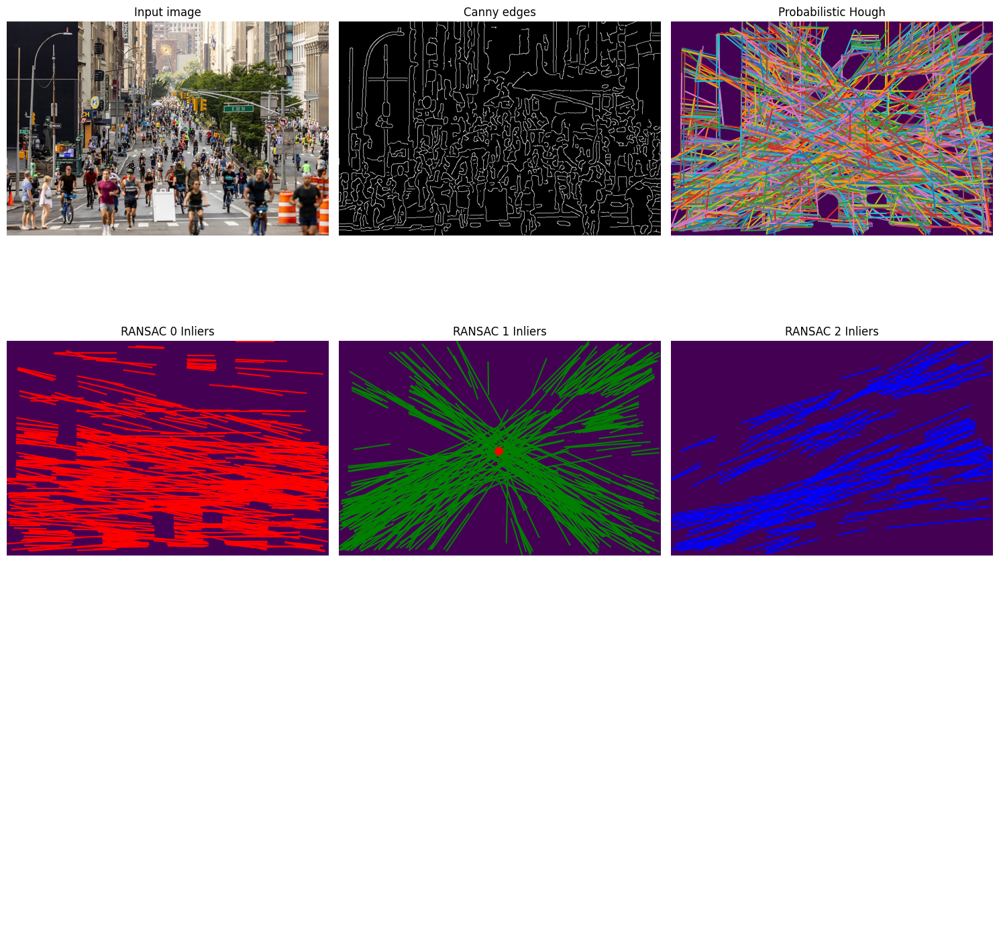

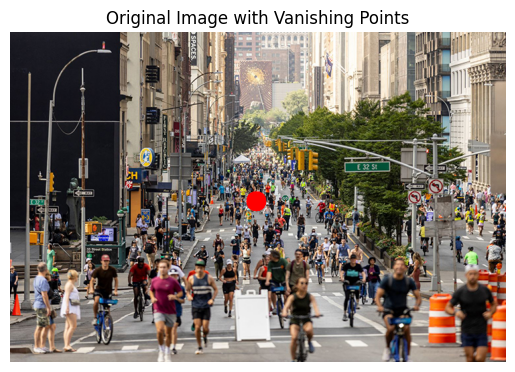

In [179]:

# Assuming you have defined and called your functions appropriately
image_path = "C://Users/wwway/Downloads/new_york_crowd.jpg"
image = read_image(image_path)
edges = get_canny_edges(image, sigma)
inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=3000, line_len=60, line_gap=40, threshold=10)
lines = viz_stuff[2]

visualize_inliers(image, edges, lines, inlier_lines_list, colors, hypothesis_list)

Très bonne estimation du point de fuite malgré le grand nombre de personnes sur la routes qui cachent les lignes de routent et ajoute un grand bruit à notre image

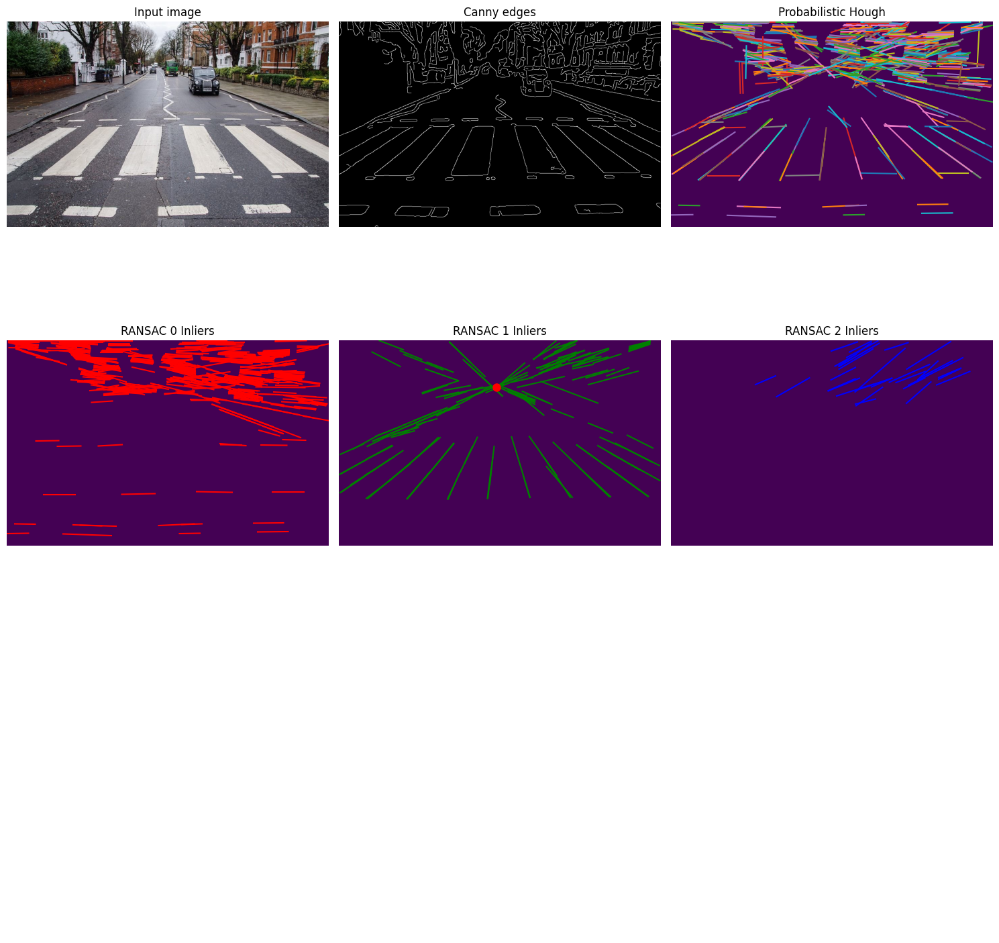

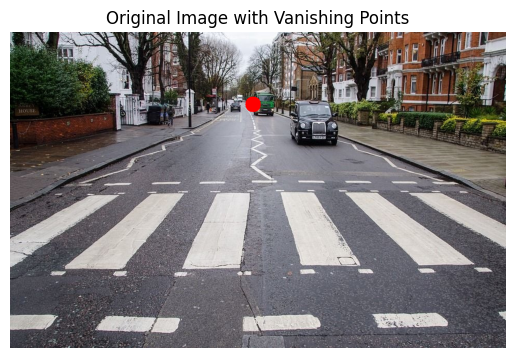

In [166]:

# Assuming you have defined and called your functions appropriately
image_path = "C://Users/wwway/Downloads/pedestrian_crossing.jpg"
image = read_image(image_path)
edges = get_canny_edges(image, sigma)

inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=3000, line_len=60, line_gap=20, threshold=15)
lines = viz_stuff[2]
colors = ['r', 'g', 'b']

visualize_inliers(image, edges, lines, inlier_lines_list, colors, hypothesis_list)

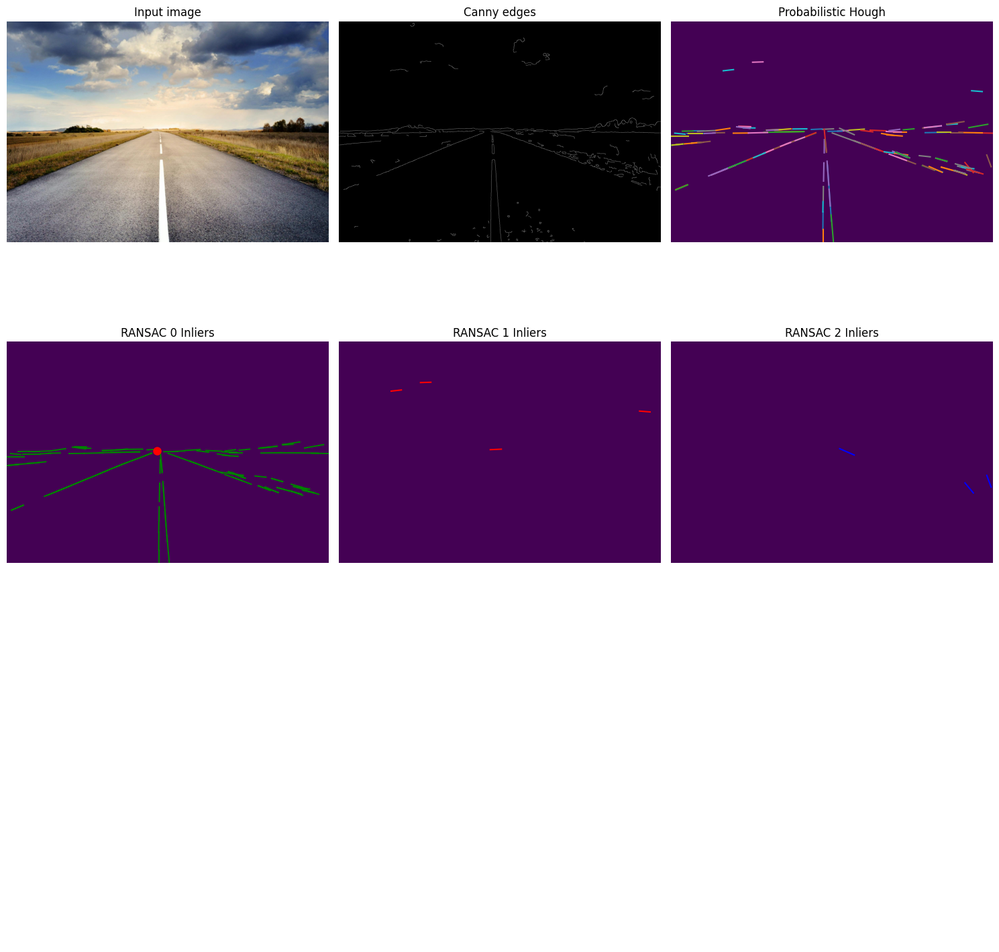

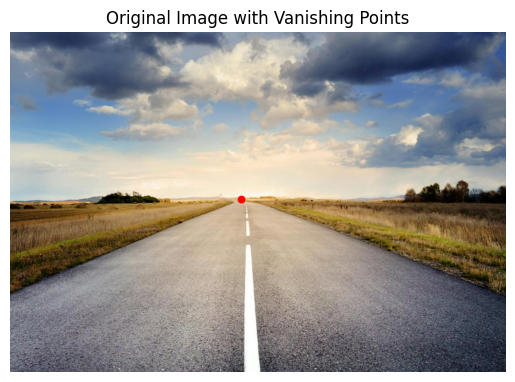

In [165]:

# Assuming you have defined and called your functions appropriately
image_path = "C://Users/wwway/Downloads/simple_road.jpg"
image = read_image(image_path)
edges = get_canny_edges(image, sigma)
inlier_lines_list,hypothesis_list,viz_stuff =  get_vp_inliers(image_path, sigma, iterations=3000, line_len=60, line_gap=20, threshold=10)
lines = viz_stuff[2]
colors = ['g', 'r', 'b']

visualize_inliers(image, edges, lines, inlier_lines_list, colors, hypothesis_list)

Très bonne précision sur la détection du point de fuite sur le reste des images ayant moins de bruit que les premiers

# Conclusion
Après avoir appliqué l'algorithme de détection des points de fuite (vanishing points) aux images et ajusté les paramètres, nous avons constaté une amélioration significative dans la localisation des points de fuite, même dans des conditions difficiles telles que des images avec beaucoup de bruit ou des lignes présentes dans des environnements complexes comme des routes courbées.

Les ajustements des paramètres tels que la valeur de sigma pour le filtre de Canny, le nombre d'itérations pour l'algorithme RANSAC, la longueur minimale des lignes détectées par Hough, et l'espacement maximal entre les lignes ont permis d'optimiser la précision et la robustesse de la détection des points de fuite.

En conclusion, l'approche utilisée basée sur l'algorithme de RANSAC a démontré sa capacité à identifier efficacement les points de fuite dans des scènes complexes, dépassant les performances des autres méthodes essayées sur le smêmes images avec bruit, offrant ainsi une méthode prometteuse pour l'analyse et la compréhension de la perspective dans les images, notamment dans des contextes tels que la cartographie, la vision par ordinateur et l'analyse de scènes urbaines.